In [1]:
try:
    import mmcv
    print("MMCV Version:", mmcv.__version__)
except ImportError:
    print("MMCV не установлен")
    
try:
    import mmengine
    print("MMEngine Version:", mmengine.__version__)
except ImportError:
    print("MMEngine не установлен")

try:
    import mmseg
    print("MMSegmentation Version:", mmseg.__version__)
except ImportError:
    print("MMSegmentation не установлен")


c:\Project\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


MMCV Version: 1.6.0
MMEngine Version: 0.8.0
MMSegmentation Version: 0.29.0


c:\Project\.venv\lib\site-packages\torch\functional.py:568: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:2228.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
c:\Project\.venv\lib\site-packages\mmseg\models\losses\cross_entropy_loss.py:235: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


load checkpoint from local path: upernet_beit-large_fp16_8x1_640x640_160k_ade20k-8fc0dd5d.pth


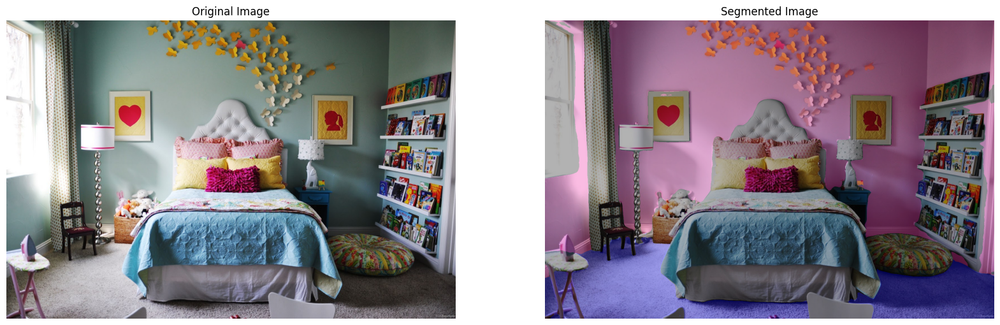

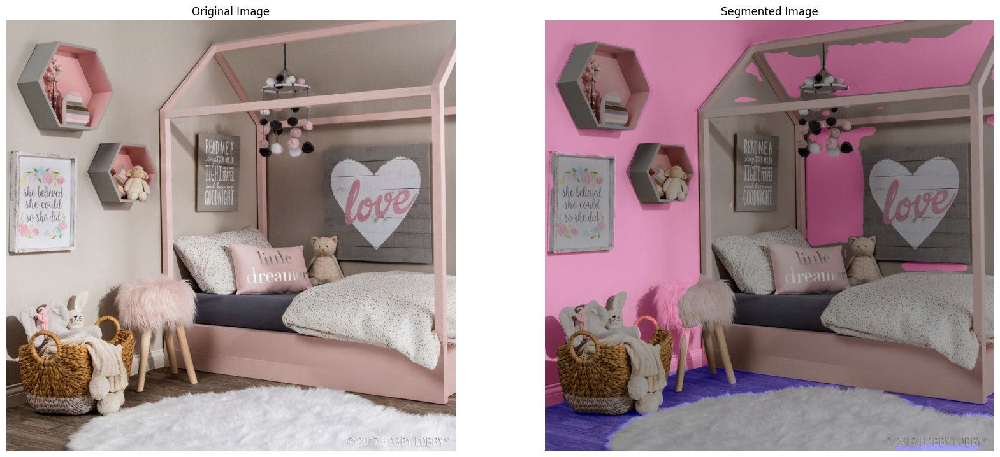

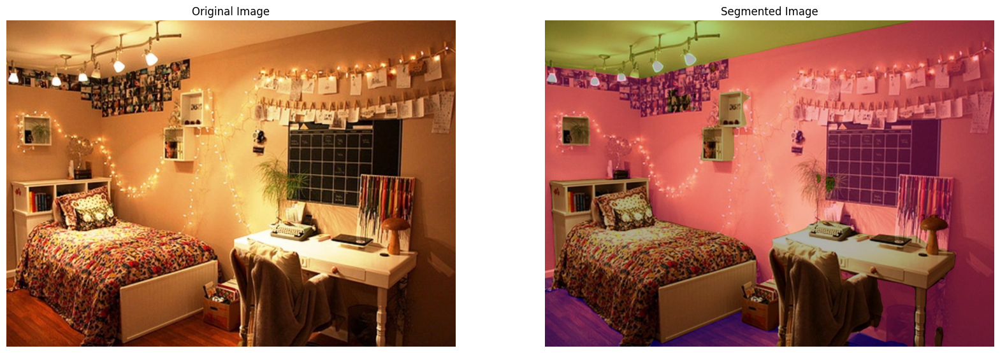

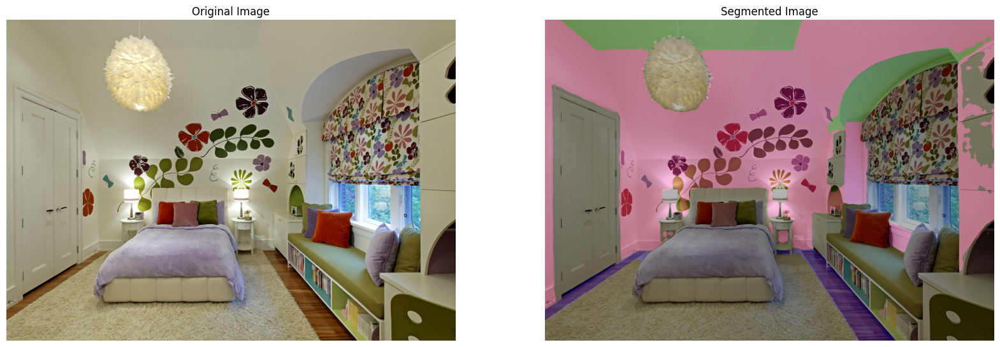

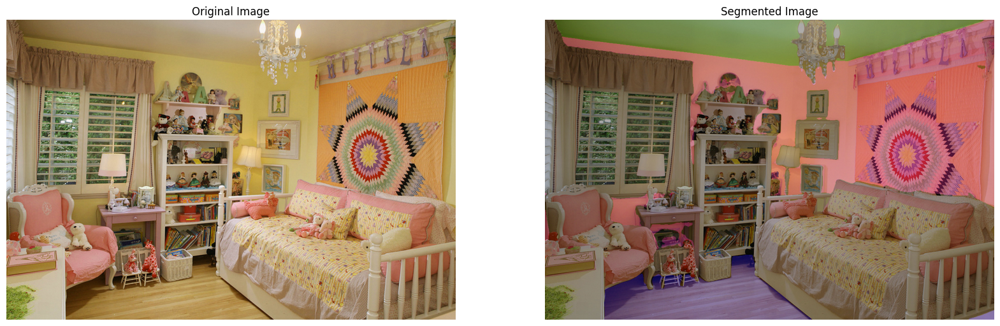

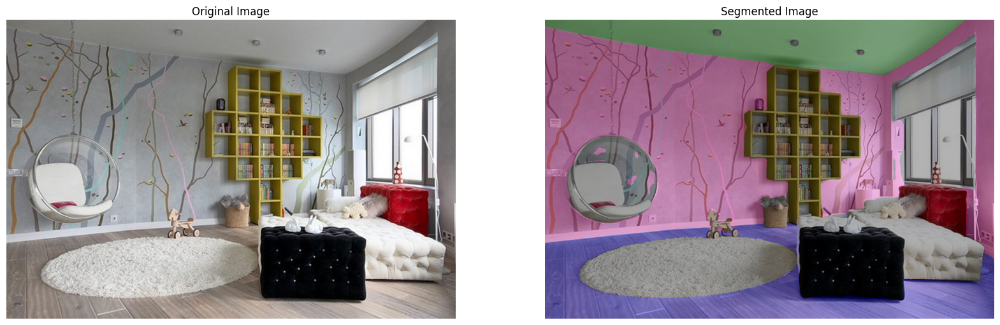

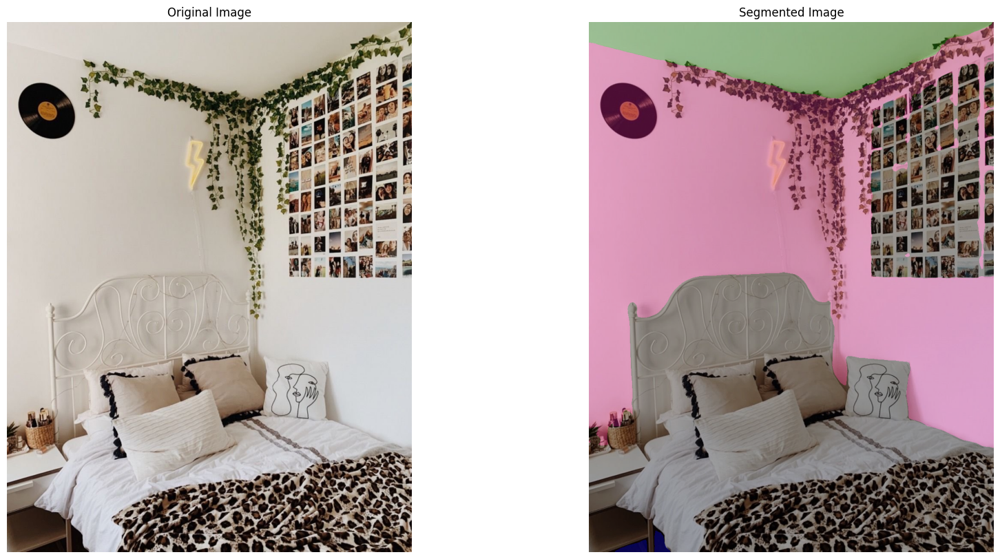

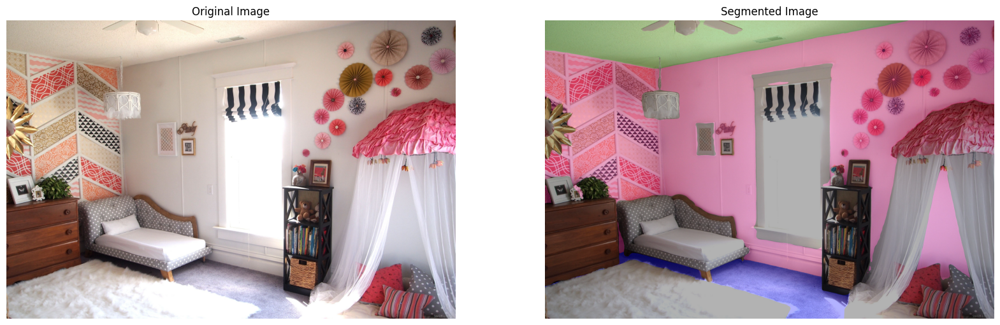

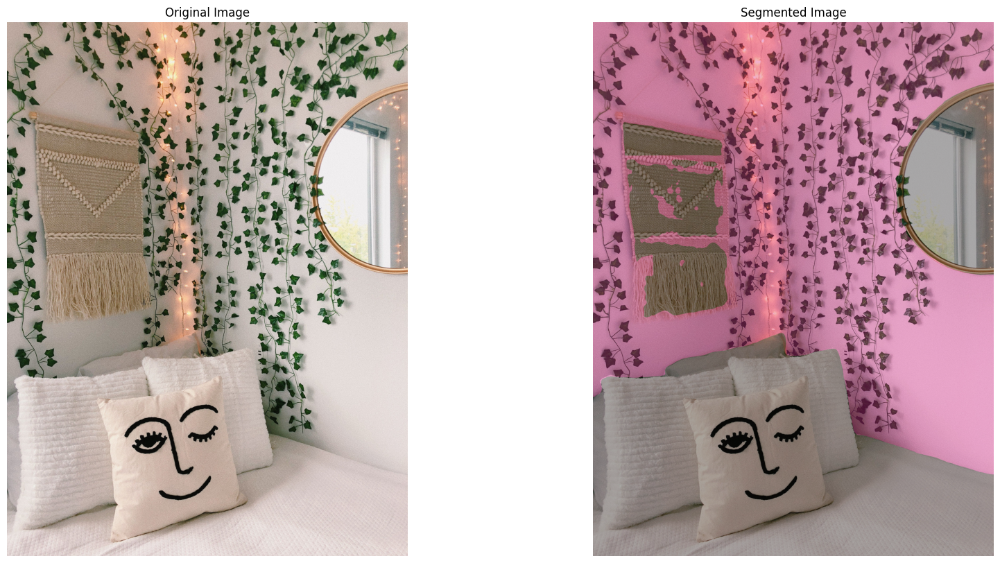

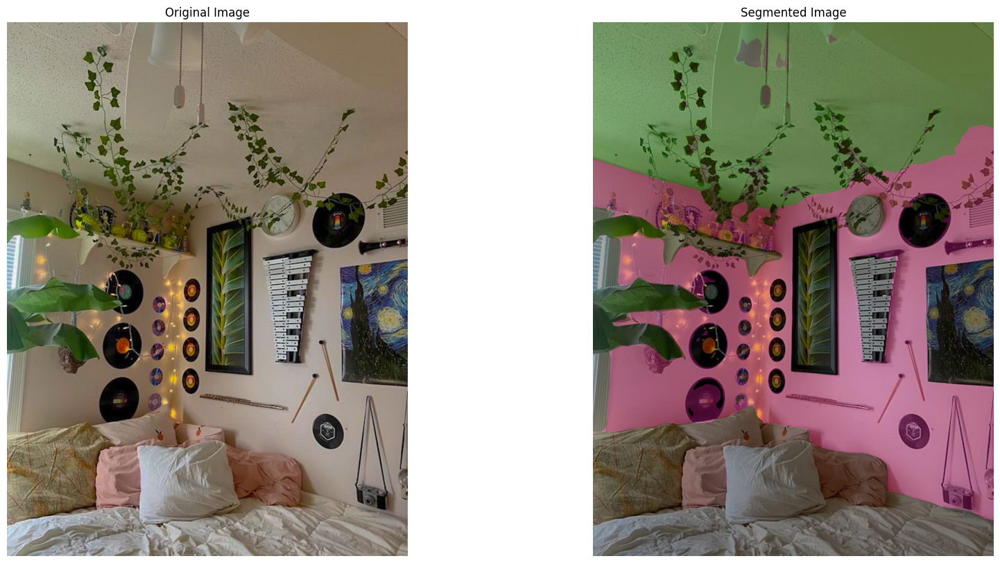

In [2]:
import os
import requests
import zipfile
import torch
import mmcv
import numpy as np
import matplotlib.pyplot as plt
from mmseg.apis import inference_segmentor, init_segmentor
from mmcv import Config
import time

# Укажите рабочую директорию с обрабатываемыми изображениями
image_directory = r'G:\___________Стажировки\Пробки\Фото'

# URLs для скачивания
repo_url = 'https://github.com/open-mmlab/mmsegmentation/archive/refs/heads/master.zip'
repo_dir = 'mmsegmentation-master'
config_dir = os.path.join(repo_dir, 'configs')

# Функция для скачивания файла
def download_file(url, local_filename):
    with requests.get(url, stream=True) as r:
        r.raise_for_status()
        with open(local_filename, 'wb') as f:
            for chunk in r.iter_content(chunk_size=8192):
                f.write(chunk)

# Скачиваем и распаковываем репозиторий, если он еще не скачан
if not os.path.isdir(repo_dir):
    zip_path = 'mmsegmentation.zip'
    download_file(repo_url, zip_path)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall()
    os.remove(zip_path)

# Получаем список конфигурационных файлов
config_files = []
for root, _, files in os.walk(config_dir):
    for file in files:
        if file.endswith('.py'):
            config_files.append(os.path.join(root, file))

# Список известных моделей и их URL
model_urls = {
    "upernet_beit-large_fp16_8x1_640x640_160k_ade20k": "https://download.openmmlab.com/mmsegmentation/v0.5/beit/upernet_beit-large_fp16_8x1_640x640_160k_ade20k/upernet_beit-large_fp16_8x1_640x640_160k_ade20k-8fc0dd5d.pth"
}

# Цвета для визуализации
color_mapping = {
    'ade20k': {0: (160, 32, 240), 3: (255, 0, 0), 5: (0, 128, 0)}
}

# Функция для предсказания и визуализации
def predict_and_visualize(model, image_path, dataset_name):
    # Предсказание
    image = mmcv.imread(image_path)
    start_time = time.time()
    result = inference_segmentor(model, image)
    end_time = time.time()
    prediction_time = end_time - start_time

    # Преобразование тензоров в numpy массивы
    seg_map = result[0].cpu().numpy() if isinstance(result[0], torch.Tensor) else result[0]

    # Визуализация
    plt.figure(figsize=(20, 10))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.axis('off')
    plt.imshow(mmcv.bgr2rgb(image))  # Конвертация BGR в RGB

    # Визуализация результата сегментации
    color_seg = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
    for label, color in color_mapping[dataset_name].items():
        color_seg[seg_map == label, :] = color

    img = image * 0.7 + color_seg * 0.3
    img = img.astype(np.uint8)

    plt.subplot(1, 2, 2)
    plt.title('Segmented Image')
    plt.axis('off')
    plt.imshow(mmcv.bgr2rgb(img))  # Конвертация BGR в RGB

    plt.show()

    return prediction_time

# Функция для поиска всех изображений в заданной директории и её поддиректориях
def find_images_in_directory(directory):
    image_extensions = ['.jpg', '.jpeg', '.png', '.bmp', '.tif', '.tiff']
    image_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in image_extensions):
                image_paths.append(os.path.join(root, file))
    return image_paths

# Поиск всех изображений в директории и её поддиректориях
image_paths = find_images_in_directory(image_directory)

summary = []

# Проход по всем конфигурациям и моделям
for config_file in config_files:
    config_path = config_file
    model_name = os.path.basename(config_file).split('.')[0]
    
    if model_name not in model_urls:
        continue

    checkpoint_url = model_urls[model_name]
    checkpoint_path = os.path.basename(checkpoint_url)

    # Скачиваем модель, если она еще не скачана
    if not os.path.isfile(checkpoint_path):
        try:
            download_file(checkpoint_url, checkpoint_path)
        except requests.HTTPError as e:
            print(f'Error downloading {checkpoint_url}: {e}')
            continue

    # Определяем имя набора данных
    if 'ade20k' in model_name:
        dataset_name = 'ade20k'
    else:
        continue

    # Загружаем модель один раз
    cfg = Config.fromfile(config_path)
    cfg.model.test_cfg.avg_non_ignore = True
    if 'evaluation' not in cfg:
        cfg.evaluation = dict(metric=['mIoU', 'mDice', 'mAcc', 'precision', 'recall'])
    model = init_segmentor(cfg, checkpoint_path, device='cuda:0' if torch.cuda.is_available() else 'cpu')

    # Применяем модель и визуализируем результат для каждого изображения
    for image_path in image_paths:
        try:
            prediction_time = predict_and_visualize(model, image_path, dataset_name)
            summary.append((model_name, image_path, prediction_time))
        except Exception as e:
            print(f'Error processing {image_path} with {config_file} and {checkpoint_path}: {e}')


(1080, 1484, 3)


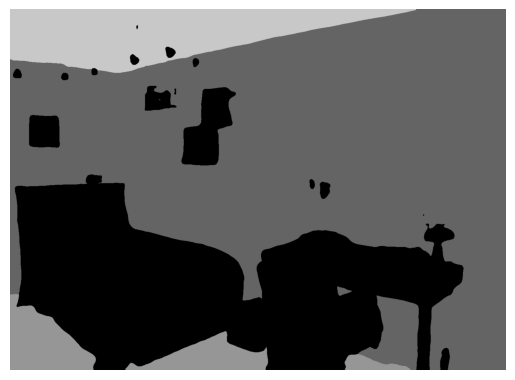

In [36]:
color_mapping = {
    'ade20k': {0: (100), 3: (150), 5: (200)}
}
def predict_and_visualize(model, image_path, dataset_name):
    # Предсказание
    image = mmcv.imread(image_path)
    result = inference_segmentor(model, image)

    # Преобразование тензоров в numpy массивы
    seg_map = result[0].cpu().numpy() if isinstance(result[0], torch.Tensor) else result[0]
    seg_floor = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
    seg_floor[seg_map == 3, :] = 150
    seg_ceiling = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
    seg_ceiling[seg_map == 5, :] = 200
    seg_wall  = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
    seg_wall[seg_map == 0, :] = 100
    seg_all = [seg_floor, seg_wall, seg_ceiling]
    color_seg = np.zeros((seg_map.shape[0], seg_map.shape[1], 3), dtype=np.uint8)
    for label, color in color_mapping[dataset_name].items():
        color_seg[seg_map == label, :] = color

    img = image * 0.7 + color_seg * 0.3
    img = img.astype(np.uint8)


    return seg_map, color_seg, seg_all, image
path_photo = r'G:\___________Стажировки\Пробки\Фото\2.jpg'
seg, color_seg, seg_all, image = predict_and_visualize(model, path_photo, dataset_name)
print(image.shape)
plt.imshow(color_seg)
plt.axis('off')
plt.show()


(1063, 1600, 3)
1063 1600


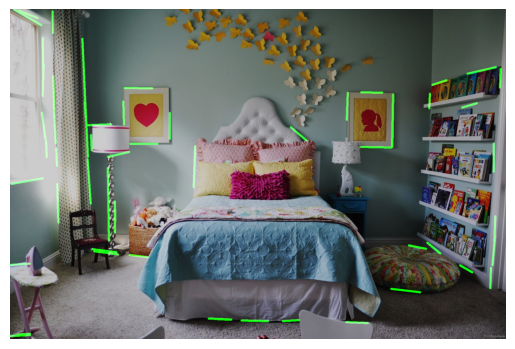

In [24]:
import cv2
def drow_the_lines(img, lines):
    img = np.copy(img) #Делаем копию, чтобы текущее изображение не изменилось
    print(img.shape)
    print(img.shape[0], img.shape[1])
    blank_image = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8) # Создаём чёрное изображение таго же размера, как исходное

    for line in lines: # Проходим по всем линиям, найденным cv2.HoughLinesP
        for x1, y1, x2, y2 in line: #
            cv2.line(blank_image, (x1,y1), (x2,y2), (0, 255, 0), thickness=5) # Рисуем эти линии на blank_image

    img = cv2.addWeighted(img, 0.8, blank_image, 1, 0.0) # Накладываем линии на исходное изображение
    return img
path = r'C:\Project\Corn\Photo\1.jpg'
seg, color_seg, seg_all = predict_and_visualize(model, path, dataset_name)
image = cv2.imread(path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
lines_list = []

for seg in seg_all:

  canny_image = cv2.Canny(seg, 50, 150)
  try:
    lines = cv2.HoughLinesP(canny_image, # Находим линии с помощью преобразования Хаффа
                            rho=6,
                            theta=np.pi/180,
                            threshold=160,
                            lines=np.array([]), # вектор линий. Каждая линия представляет вектор длиной 4 (x1,y1,x2,y2)
                            minLineLength=40,
                            maxLineGap=25)
    if len(lines_list) == 0:
      lines_list = list(lines)
    else:
      lines_list = lines_list + list(lines)
  except:
     print('')
img_line = drow_the_lines(image, lines_list)
plt.imshow(img_line)
plt.axis('off')
plt.show()

In [86]:
def show_pic(original_img,segmentation_img):
  # Отображение результирующего изображения
  # Визуализация
    plt.figure(figsize=(20, 10))

    # Оригинальное изображение
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.axis('off')
    plt.imshow(original_img)  # Конвертация BGR в RGB

    plt.subplot(1, 2, 2)
    plt.title('Segmented Image')
    plt.axis('off')
    plt.imshow(segmentation_img)  # Конвертация BGR в RGB

    plt.show()

# texture_image=texture_image[..., ::-1]
# show_pic(texture_image,'Исходная текстура')

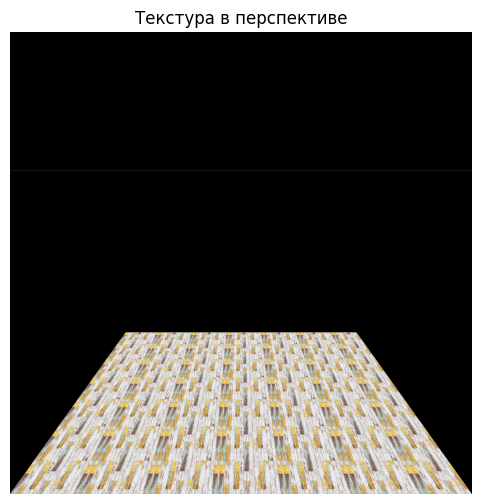

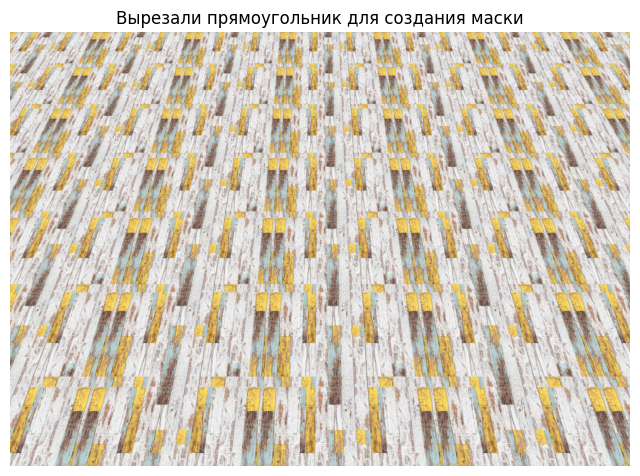

In [85]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
def fill_texture_in_perspective(path_to_texture,original_image):

  # Загрузка текстурного изображения
  texture = cv2.imread(path_to_texture)
  tex = np.zeros((texture.shape[0]*2, texture.shape[1]*2, 3),dtype=np.uint8)
  tex[0:texture.shape[0], 0:texture.shape[1]] = texture
  tex[texture.shape[0]:2*texture.shape[0], 0:texture.shape[1]] = texture
  tex[0:texture.shape[0], texture.shape[1]:2*texture.shape[1]] = texture
  tex[0:texture.shape[0], 0:texture.shape[1]] = texture
  texture = tex
  if texture is None:
      print("Не удалось загрузить текстурное изображение.")
      exit()

  width, height,_ = original_image.shape
  # print('width, height original',width, height)
  # Размеры текстуры и полотна
  texture_size = 600
  plane_width = max(width, height)*2
  if plane_width*0.35<height:
    plane_width=int(height/0.35)
  plane_height = plane_width

  # Создание пустого полотна
  plane = np.zeros((plane_height, plane_width, 3), dtype=np.uint8)

  # Наложение текстуры на полотно с учетом граничных условий
  for y in range(0, plane_height, texture_size):
      for x in range(0, plane_width, texture_size):
          # Вычисляем размер текстурного кусочка
          texture_patch_width = min(texture_size, plane_width - x)
          texture_patch_height = min(texture_size, plane_height - y)

          # Вырезаем кусочек текстуры
          texture_patch = texture[:texture_patch_height, :texture_patch_width]

          # Вставляем текстуру на полотно
          plane[y:y+texture_patch_height, x:x+texture_patch_width] = texture_patch

  # Координаты исходных точек
  src_points = np.float32([
      [0, 0],
      [plane_width, 0],
      [plane_width, plane_height],
      [0, plane_height]
  ])

  # Координаты целевых точек
  dst_points = np.float32([
      [plane_width * 0.25, plane_height * 0.65],  # Верхний левый угол смещен вправо
      [plane_width * 0.75, plane_height * 0.65],  # Верхний правый угол смещен влево
      [plane_width, plane_height],    # Нижний правый угол без изменений
      [0, plane_height]         # Нижний левый угол без изменений
  ])

  # Вычисление матрицы перспективного преобразования
  M = cv2.getPerspectiveTransform(src_points, dst_points)

  # Применение перспективного преобразования
  warped_image = cv2.warpPerspective(plane, M, (plane_width, plane_height))

  # Координаты для вырезания прямоугольника
  x, y = int(plane_width * 0.25), int(plane_height * 0.65)
  width, height = int(plane_width * 0.75 - plane_width * 0.25), int(plane_height - plane_height * 0.65)

  # Вырезание прямоугольника из изображения
  texture_image = cv2.getRectSubPix(warped_image, (width, height), (x + width/2, y + height/2))

  return cv2.cvtColor(warped_image, cv2.COLOR_BGR2RGB),cv2.cvtColor(texture_image, cv2.COLOR_BGR2RGB)

#warped_image,texture_image= fill_texture_in_perspective(path_to_texture,image)
#show_pic(warped_image,'Текстура в перспективе')
#show_pic(texture_image,'Вырезали прямоугольник для создания маски')


In [82]:
import cv2
import numpy as np

def transform_texture(original_image,texture_image, floor_mask):
  # print('original_image.shape,floor_mask.shape, texture_image.shape',original_image.shape,floor_mask.shape, texture_image.shape)

  original_image = np.array(original_image)
  
  # Пропорциональное масштабирование текстуры под исходное изображение
  scale_factor = max(original_image.shape[0] / texture_image.shape[0], original_image.shape[1] / texture_image.shape[1])

  rescaled_texture = cv2.resize(texture_image, (int(texture_image.shape[1] * scale_factor), int(texture_image.shape[0] * scale_factor)))
  #print(f'rescaled_texture.shape = {rescaled_texture.shape}')
  # Нахождение центров масштабированной текстуры и исходного изображения
  center_original = (original_image.shape[1] // 2, original_image.shape[0] // 2)
  center_texture = (rescaled_texture.shape[1] // 2, rescaled_texture.shape[0] // 2)

  # Определение области обрезки для текстуры
  start_x = max(center_texture[0] - center_original[0], 0)
  start_y = max(center_texture[1] - center_original[1], 0)
  end_x = min(center_texture[0] + original_image.shape[1] - center_original[0], rescaled_texture.shape[1])
  end_y = min(center_texture[1] + original_image.shape[0] - center_original[1], rescaled_texture.shape[0])

  # Обрезка текстуры
  texture_image = rescaled_texture[start_y:end_y, start_x:end_x]
  #print(f'texture_image.shape = {texture_image.shape}')
  # Преобразование цветных пикселей пола в серую гамму по маске пола
  gray_floor = cv2.cvtColor(original_image, cv2.COLOR_BGR2GRAY)
  gray_floor_colored = cv2.cvtColor(gray_floor, cv2.COLOR_GRAY2BGR)  # Преобразование обратно в трехканальное изображение

  # Создание копии оригинального изображения для смешивания
  blended_image = original_image.copy()
  blended_image[floor_mask > 0] = texture_image[floor_mask > 0]

  # Задание пропорции смешивания
  alpha = 0.2  # Пример пропорции (50% оригинальное изображение, 50% текстура)

  # Смешивание серого пола с текстурой по маске пола
  #blended_image[floor_mask > 0] = cv2.addWeighted(gray_floor_colored[floor_mask > 0], alpha, texture_image[floor_mask > 0], 1 - alpha, 0)

  return blended_image

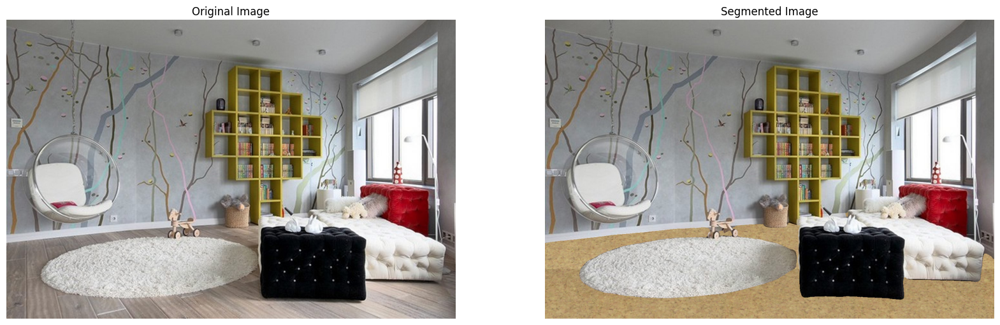

In [88]:
path_photo = r'C:\Project\Corn\Photo\5.jpg'
path_to_texture = r'C:\Project\Corn\textures\1.jpg'
_, _, seg_all, image = predict_and_visualize(model, path_photo, dataset_name)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
_,texture_image= fill_texture_in_perspective(path_to_texture,image)
floor_mask = seg_all[0]
blended_image  = transform_texture(image,texture_image, floor_mask)
show_pic(image, blended_image)

In [ ]:
path_img = r'C:\Project\Corn\Photo\1.jpg'

original_image=np.array(path_img)
print()